<a href="https://colab.research.google.com/github/srijanpandey91/Text_classification_using_NLP/blob/main/Text_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#from pydrive.auth import GoogleAuth
#from pydrive.drive import GoogleDrive
#from google.colab import auth
#from oauth2client.client import GoogleCredentials

In [ ]:
#auth.authenticate_user()
#gauth = GoogleAuth()
#gauth.credentials = GoogleCredentials.get_application_default()
#drive = GoogleDrive(gauth)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import json
import string
import numpy as np
import pandas as pd
from pandas.io.json import json_normalize
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
#!pip install gensim
#!pip install lightgbm

In [ ]:
import re
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords  # stop words are, is, the etc. which are not needed for model
from nltk.stem.porter import PorterStemmer
from gensim.models import word2vec
from sklearn.manifold import TSNE
%matplotlib inline
from plotly import tools  # to install $ pip install plotly
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
from sklearn.tree import DecisionTreeClassifier 
from sklearn import model_selection, preprocessing, metrics, ensemble, naive_bayes, linear_model
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import TruncatedSVD
import lightgbm as lgb # to install $ pip install lightgbm
from PIL import Image

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
df = pd.read_csv('/content/drive/My Drive/data (10).csv')

In [ ]:
df.head()

,URL,title,text,fact
0,https://www.activistpost.com/2017/09/new-hamps...,Allows Local Common Core Opt Out,"By Michael Maharrey Today, a New Hampshire law...",0
1,http://beforeitsnews.com/u-s-politics/2017/10/...,Senators Eviscerate Wells Fargo CEO Over Fake ...,Senators Eviscerate Wells Fargo CEO Over Fake ...,0
2,http://edition.cnn.com/videos/us/2017/10/05/cn...,CNN Hero Mona Patel,"After her own struggles as an amputee, Mona Pa...",1
3,http://beforeitsnews.com/sports/2017/10/107-ch...,"10/7: Chuck Axed; HBD Brickyard, Adam, Moonlig...","Vietnam Is in Great Danger, You Must Publish a...",0
4,http://beforeitsnews.com/sports/2017/09/nfl-ma...,NFL Marketing Machine,NFL Marketing Machine\n(Before It's News)\nHey...,0


In [ ]:
df.shape

(3554, 4)

In [ ]:
factval = df.fact.value_counts()
factval

0    1880
1    1674
Name: fact, dtype: int64

Text(0.5, 1.0, 'frequency distribution of real and fake news')

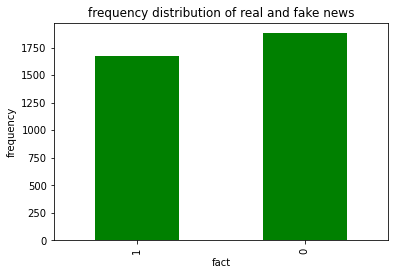

In [ ]:
df.fact.value_counts().sort_values().plot(kind = 'bar', color = 'green')
plt.xlabel('fact')
plt.ylabel('frequency')
plt.title('frequency distribution of real and fake news')

In [ ]:
df.URL.value_counts()

http://beforeitsnews.com/sports/2017/10/102-happenings-hbd-erniehonest-eddie-rex-maury-big-red-marino-lamont-axed-bucs-sold-more-2701710.html\r\n              5
http://beforeitsnews.com/sports/2017/10/105-expo-park-forbes-field-bucs-win-60-opener-lose-27-puds-300-hbd-claude-felix-sarge-grays-win-ws-2701996.html\r\n    5
http://beforeitsnews.com/sports/2017/10/ravens-raiders-thursday-2-2702051.html\r\n                                                                             5
http://beforeitsnews.com/sports/2017/10/2017-fantasy-football-team-defense-rankings-week-5-2701900.html\r\n                                                    5
http://beforeitsnews.com/u-s-politics/2017/10/everything-was-burned-rohingya-remain-doubtful-of-myanmars-promises-2537204.html\r\n                             5
                                                                                                                                                              ..
https://www.reuters.com/article/us

In [ ]:
# Handel if title or news content is blank 

import math
def title_column(tuple1):
    #print(tuple1[2])
    if(type(tuple1[0]) == float or type(tuple1[0]) == int):
        if(math.isnan(tuple1[0])):
            tuple1[0] = ''
            
    if(pd.notna(tuple1[0])):
        if(tuple1[0].strip(' \t\n\r') == ''):
            return re.sub(r"[^A-Za-z0-9(),!?\'\`]", " ", tuple1[1])
        else:
            return re.sub(r"[^A-Za-z0-9(),!?\'\`]", " ", tuple1[0])
    else:
            return re.sub(r"[^A-Za-z0-9(),!?\'\`]", " ", tuple1[0])
        
        
def text_column(tuple1):
    #print(tuple1[2])
    if(type(tuple1[1]) == float or type(tuple1[1]) == int):
        if(math.isnan(tuple1[1])):
            tuple1[1] = ''
            
    if(pd.notna(tuple1[1])):
        if(tuple1[1].strip(' \t\n\r') == ''):
            return re.sub(r"[^A-Za-z0-9(),!?\'\`]", " ", tuple1[0])
        else:
            return re.sub(r"[^A-Za-z0-9(),!?\'\`]", " ", tuple1[1]) 
    else:
            return re.sub(r"[^A-Za-z0-9(),!?\'\`]", " ", tuple1[1])
      
df['title'] = df[['title', 'text']].apply(title_column, axis=1)
df['text'] = df[['title', 'text' ]].apply(text_column, axis=1)

In [ ]:
nltk.download('punkt')
from nltk import word_tokenize

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


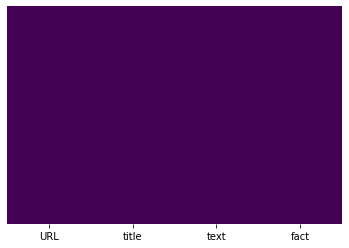

In [ ]:
# to check missing values
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [ ]:
import pdb
def CleaningText(txt):
    review = re.sub('[^a-zA-Z]', ' ', txt) # Cleans all except characters
    #print("lin1")
    review = review.lower()
    #print("lin2")
    review = review.split()
    #print("lin3")
    ps = PorterStemmer()
    #print("lin4")
    review = [ps.stem(word) for word in review if not word in set(stopwords.words('english'))]
    #print("lin5")
    review = ' '.join(review)
    #print("lin6")
    return review

In [ ]:
df.fact.unique()

array([0, 1])

In [ ]:
!pip install wordcloud
import requests
from wordcloud import WordCloud, STOPWORDS  #install $ pip install wordcloud

# Thanks : https://www.kaggle.com/aashita/word-clouds-of-various-shapes ##
def plot_wordcloud(text, mask=None, max_words=200, max_font_size=100, figure_size=(24.0,16.0), 
                   title = None, title_size=40, image_color=False):
    stopwords = set(STOPWORDS)
    more_stopwords = {'one', 'br', 'Po', 'th', 'sayi', 'fo', 'Unknown'}
    stopwords = stopwords.union(more_stopwords)

    wordcloud = WordCloud(background_color='white',
                    stopwords = stopwords,
                    max_words = max_words,
                    max_font_size = max_font_size, 
                    random_state = 42,
                    width=800, 
                    height=400,
                    mask = mask)
    wordcloud.generate(str(text))
    
    plt.figure(figsize=figure_size)
    if image_color:
        image_colors = ImageColorGenerator(mask);
        plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation="bilinear");
        plt.title(title, fontdict={'size': title_size,  
                                  'verticalalignment': 'bottom'})
    else:
        plt.imshow(wordcloud);
        plt.title(title, fontdict={'size': title_size, 'color': 'green', 
                                  'verticalalignment': 'bottom'})
    plt.axis('off');
    plt.tight_layout() 

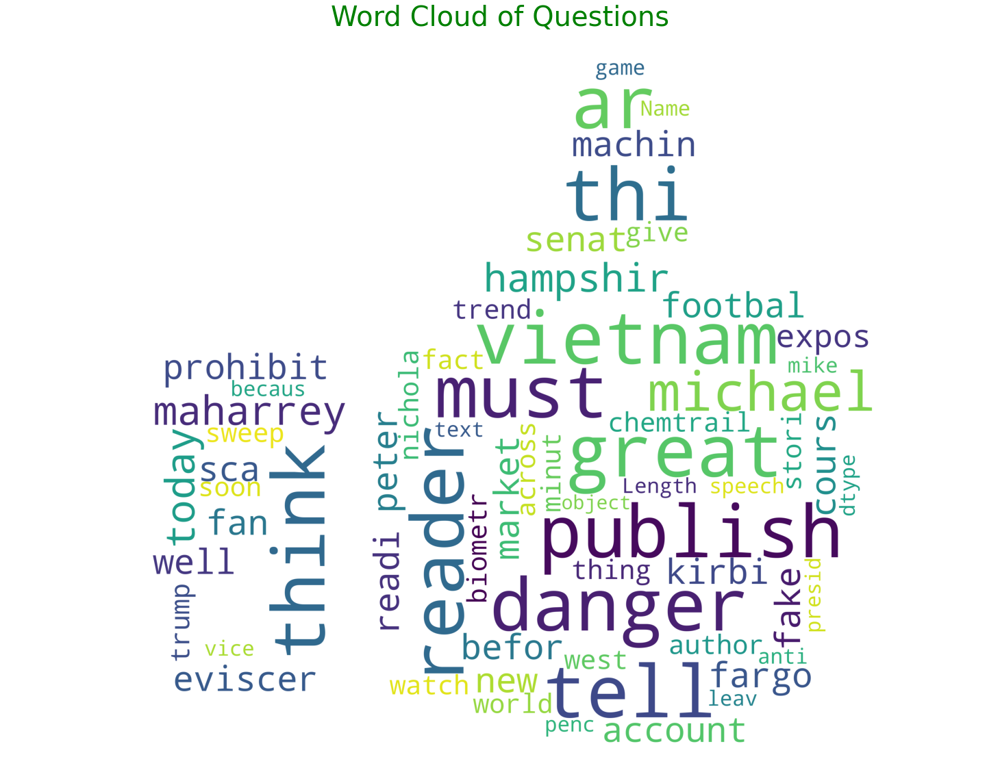

In [ ]:
#Word cloud for real words
from io import BytesIO
response = requests.get('https://raw.githubusercontent.com/manojknit/Natural_Language_Processing/master/images/upvote.png')
upvote_mask = np.array(Image.open(BytesIO(response.content)))
plot_wordcloud(df[df["fact"]==0]["text"], upvote_mask, max_words=300000, max_font_size=300, title="Word Cloud of Questions")

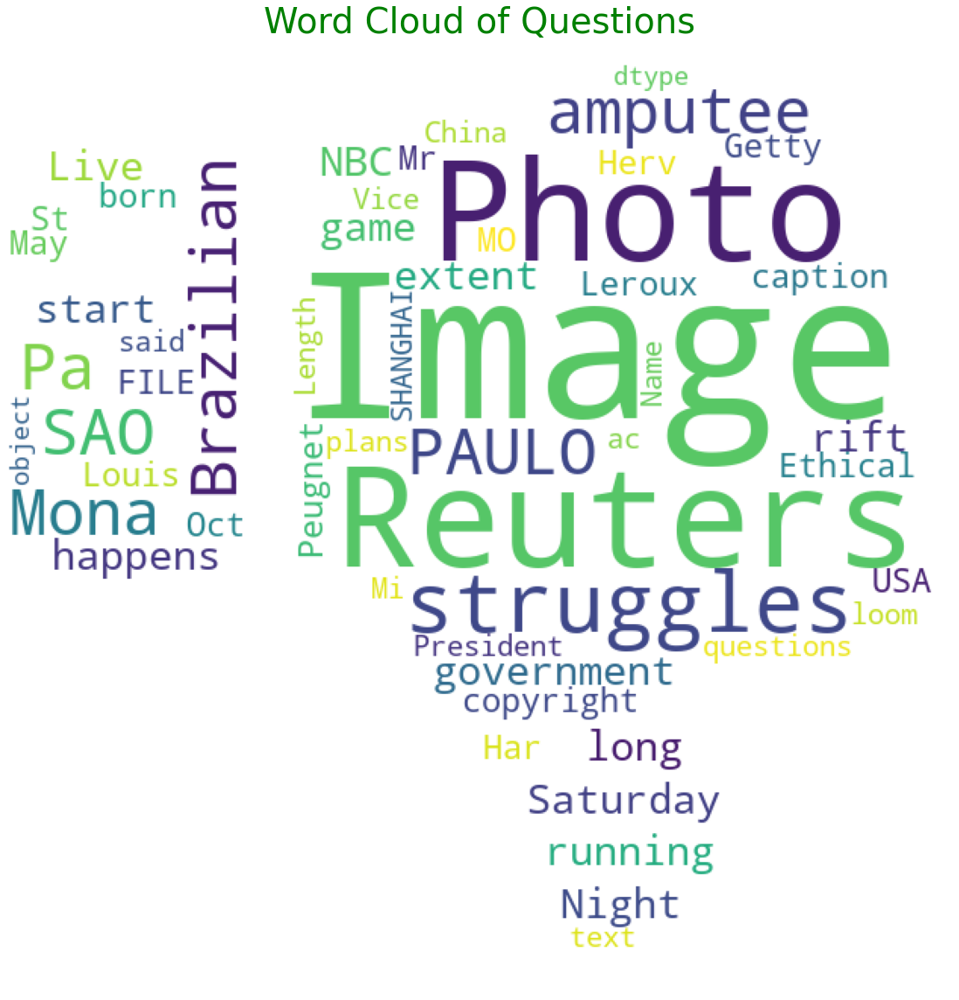

In [ ]:
#Word cloud for Fake words
response = requests.get('https://image.freepik.com/free-icon/thumbs-down-silhouette_318-41911.jpg')
upvote_mask = np.array(Image.open(BytesIO(response.content)))
plot_wordcloud(df[df["fact"]==1]["text"], upvote_mask, max_words=300000, max_font_size=300, title="Word Cloud of Questions")

In [ ]:
from collections import defaultdict
df_real = df[df["fact"]=='0']
df_fake = df[df["fact"]!='1']

/usr/local/lib/python3.6/dist-packages/pandas/core/ops/array_ops.py:253: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



In [ ]:
import nltk
import re

from gensim.models import word2vec
from sklearn.manifold import TSNE

In [ ]:
def build_corpus(data):
    "Creates a list of lists containing words from each sentence"
    corpus = []
    for sentence in df["text"].iteritems():
        word_list = sentence[1].split(" ")
        corpus.append(word_list)
            
    return corpus

In [ ]:
corpus = build_corpus(df)        


In [ ]:
corpus

[['By',
  'Michael',
  'Maharrey',
  'Today,',
  'a',
  'New',
  'Hampshire',
  'law',
  'that',
  'prohibits',
  'the',
  'state',
  'department',
  'of',
  'education',
  'and',
  'the',
  'state',
  'board',
  'of',
  'education',
  'from',
  'requiring',
  'any',
  'school',
  'or',
  'school',
  'district',
  'to',
  'implement',
  'Common',
  'Core',
  'standards',
  'goes',
  'into',
  'effect',
  '',
  'This',
  'represents',
  'an',
  'opportunity',
  'for',
  'local',
  'communities',
  'to',
  'opt',
  'out',
  'of',
  'Common',
  'Core',
  'and',
  'nullify',
  'the',
  'program',
  'in',
  'practice',
  '',
  'A',
  'coalition',
  'of',
  'Republicans',
  'introduced',
  'Senate',
  'Bill',
  '44',
  '(SB44)',
  'in',
  'January',
  '',
  'The',
  'legislation',
  'opens',
  'the',
  'door',
  'to',
  'to',
  'end',
  'common',
  'core',
  'in',
  'the',
  'state',
  'by',
  'prohibiting',
  'the',
  'department',
  'of',
  'education',
  'and',
  'the',
  'board',
  'of',

In [ ]:
def tsne_plot(model):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    for word in model.wv.vocab:
        tokens.append(model[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    a = []
    b = []
    for value in new_values:
        a.append(value[0])
        b.append(value[1])
        
    plt.figure(figsize=(16, 16)) 
    for i in range(len(a)):
        plt.scatter(a[i],b[i])
        plt.annotate(labels[i],
                     xy=(a[i], b[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



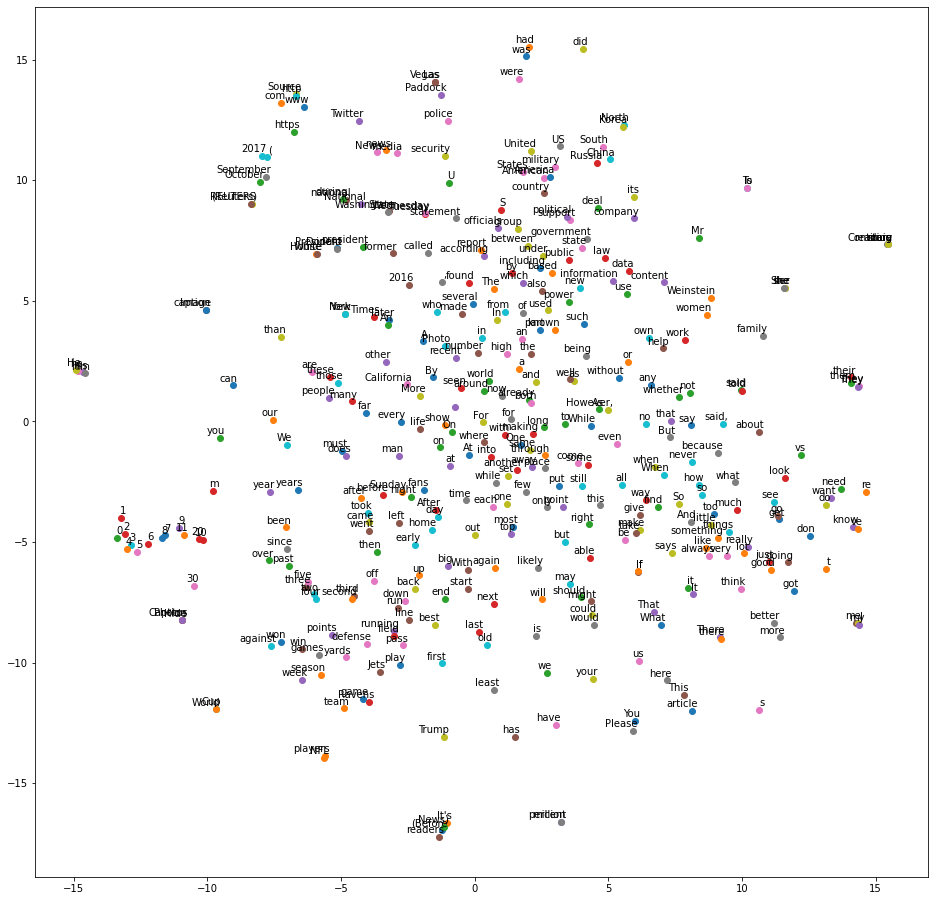

In [ ]:
model = word2vec.Word2Vec(corpus, size=100, window=20, min_count=500, workers=4)
tsne_plot(model)

In [ ]:
model.most_similar('article')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning:

Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.



[('Twitter', 0.6339670419692993),
 ('com', 0.5927897691726685),
 ('This', 0.5619404911994934),
 ('https', 0.552873969078064),
 ('media', 0.49567365646362305),
 ('based', 0.49132776260375977),
 ('By', 0.4678102433681488),
 ('here', 0.46093612909317017),
 ('content', 0.450043261051178),
 ('To', 0.4428958296775818)]

In [ ]:
df

,URL,title,text,fact
0,https://www.activistpost.com/2017/09/new-hamps...,Allows Local Common Core Opt Out,"By Michael Maharrey Today, a New Hampshire law...",0
1,http://beforeitsnews.com/u-s-politics/2017/10/...,Senators Eviscerate Wells Fargo CEO Over Fake ...,Senators Eviscerate Wells Fargo CEO Over Fake ...,0
2,http://edition.cnn.com/videos/us/2017/10/05/cn...,CNN Hero Mona Patel,"After her own struggles as an amputee, Mona Pa...",1
3,http://beforeitsnews.com/sports/2017/10/107-ch...,"10 7 Chuck Axed HBD Brickyard, Adam, Moonlig...","Vietnam Is in Great Danger, You Must Publish a...",0
4,http://beforeitsnews.com/sports/2017/09/nfl-ma...,NFL Marketing Machine,NFL Marketing Machine (Before It's News) Hey F...,0
...,...,...,...,...
3549,http://beforeitsnews.com/u-s-politics/2017/10/...,CNN and Globalist Exposed Steve Quayle and A...,"Vietnam Is in Great Danger, You Must Publish a...",0
3550,http://beforeitsnews.com/sports/2017/09/trends...,Trends to Watch,Trends to Watch of readers think this story ...,0
3551,http://beforeitsnews.com/u-s-politics/2017/10/...,Trump Jr Is Soon To Give A 30 Minute Speech F...,Trump Jr Is Soon To Give A 30 Minute Speech F...,0
3552,https://www.reuters.com/article/us-china-pharm...,China to accept overseas trial data in bid to ...,SHANGHAI (Reuters) China said it plans to ac...,1


In [ ]:
y = df.iloc[:, 3]

In [ ]:
def remove_pattern(input_txt, pattern):
    r = re.findall(pattern, input_txt)
    for i in r:
        input_txt = re.sub(i, '', input_txt)
        
    return input_txt

In [ ]:
df['newtext'] = np.vectorize(remove_pattern)(df['text'], "@[\w]*") 
df.head()

,URL,title,text,fact,newtext
0,https://www.activistpost.com/2017/09/new-hamps...,Allows Local Common Core Opt Out,"By Michael Maharrey Today, a New Hampshire law...",0,"By Michael Maharrey Today, a New Hampshire law..."
1,http://beforeitsnews.com/u-s-politics/2017/10/...,Senators Eviscerate Wells Fargo CEO Over Fake ...,Senators Eviscerate Wells Fargo CEO Over Fake ...,0,Senators Eviscerate Wells Fargo CEO Over Fake ...
2,http://edition.cnn.com/videos/us/2017/10/05/cn...,CNN Hero Mona Patel,"After her own struggles as an amputee, Mona Pa...",1,"After her own struggles as an amputee, Mona Pa..."
3,http://beforeitsnews.com/sports/2017/10/107-ch...,"10 7 Chuck Axed HBD Brickyard, Adam, Moonlig...","Vietnam Is in Great Danger, You Must Publish a...",0,"Vietnam Is in Great Danger, You Must Publish a..."
4,http://beforeitsnews.com/sports/2017/09/nfl-ma...,NFL Marketing Machine,NFL Marketing Machine (Before It's News) Hey F...,0,NFL Marketing Machine (Before It's News) Hey F...


In [ ]:
df['newtext'] = df['newtext'].str.replace("[^a-zA-Z#]", " ")
df.head(5)

,URL,title,text,fact,newtext
0,https://www.activistpost.com/2017/09/new-hamps...,Allows Local Common Core Opt Out,"By Michael Maharrey Today, a New Hampshire law...",0,By Michael Maharrey Today a New Hampshire law...
1,http://beforeitsnews.com/u-s-politics/2017/10/...,Senators Eviscerate Wells Fargo CEO Over Fake ...,Senators Eviscerate Wells Fargo CEO Over Fake ...,0,Senators Eviscerate Wells Fargo CEO Over Fake ...
2,http://edition.cnn.com/videos/us/2017/10/05/cn...,CNN Hero Mona Patel,"After her own struggles as an amputee, Mona Pa...",1,After her own struggles as an amputee Mona Pa...
3,http://beforeitsnews.com/sports/2017/10/107-ch...,"10 7 Chuck Axed HBD Brickyard, Adam, Moonlig...","Vietnam Is in Great Danger, You Must Publish a...",0,Vietnam Is in Great Danger You Must Publish a...
4,http://beforeitsnews.com/sports/2017/09/nfl-ma...,NFL Marketing Machine,NFL Marketing Machine (Before It's News) Hey F...,0,NFL Marketing Machine Before It s News Hey F...


In [ ]:
df['newtext'] = df['newtext'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>3]))

In [ ]:
tokenized_text = df['newtext'].apply(lambda x: x.split()) # tokenizing

In [ ]:
tokenized_text.head()

0    [Michael, Maharrey, Today, Hampshire, that, pr...
1    [Senators, Eviscerate, Wells, Fargo, Over, Fak...
2    [After, struggles, amputee, Mona, Patel, start...
3    [Vietnam, Great, Danger, Must, Publish, Tell, ...
4    [Marketing, Machine, Before, News, FANS, ready...
Name: newtext, dtype: object

In [ ]:
from nltk.stem.porter import *
stemmer = PorterStemmer()

tokenized_text = tokenized_text.apply(lambda x: [stemmer.stem(i) for i in x]) # stemming

In [ ]:
stemmer.stem("running")

'run'

In [ ]:
for i in range(len(tokenized_text)):
    tokenized_text[i] = ' '.join(tokenized_text[i])
    
df['text'] = tokenized_text

In [ ]:
df['text'].head()

0    michael maharrey today hampshir that prohibit ...
1    senat eviscer well fargo over fake account sca...
2    after struggl ampute mona patel start nonprofi...
3    vietnam great danger must publish tell your ar...
4    market machin befor new fan readi more footbal...
Name: text, dtype: object

In [ ]:
from gensim.models import Word2Vec

In [ ]:
tokenized_text = df['text'].apply(lambda x: x.split()) # tokenizing

model_w2v = Word2Vec(tokenized_text, size=200,  window=5)

model_w2v.train(tokenized_text, total_examples= len(df['text']), epochs=20)

(19690253, 21377840)

In [ ]:
def word_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v[word].reshape((1, size))
            count += 1.
        except KeyError: # handling the case where the token is not in vocabulary
                         
            continue
    if count != 0:
        vec /= count
    return vec

In [ ]:
wordvec_arrays = np.zeros((len(tokenized_text), 200))

for i in range(len(tokenized_text)):
    wordvec_arrays[i,:] = word_vector(tokenized_text[i], 200)
    
wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: DeprecationWarning:

Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).



(3554, 200)

In [ ]:
X = df.iloc[:, -1]
y = df.iloc[:, 3]

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
df.shape

(3554, 5)

In [ ]:
df.head()

,URL,title,text,fact,newtext
0,https://www.activistpost.com/2017/09/new-hamps...,Allows Local Common Core Opt Out,michael maharrey today hampshir that prohibit ...,0,Michael Maharrey Today Hampshire that prohibit...
1,http://beforeitsnews.com/u-s-politics/2017/10/...,Senators Eviscerate Wells Fargo CEO Over Fake ...,senat eviscer well fargo over fake account sca...,0,Senators Eviscerate Wells Fargo Over Fake Acco...
2,http://edition.cnn.com/videos/us/2017/10/05/cn...,CNN Hero Mona Patel,after struggl ampute mona patel start nonprofi...,1,After struggles amputee Mona Patel started non...
3,http://beforeitsnews.com/sports/2017/10/107-ch...,"10 7 Chuck Axed HBD Brickyard, Adam, Moonlig...",vietnam great danger must publish tell your ar...,0,Vietnam Great Danger Must Publish Tell Your Ar...
4,http://beforeitsnews.com/sports/2017/09/nfl-ma...,NFL Marketing Machine,market machin befor new fan readi more footbal...,0,Marketing Machine Before News FANS ready more ...


In [ ]:
train_w2v = wordvec_df.iloc[:3554,:]
test_w2v = wordvec_df.iloc[3554:,:]

In [ ]:
_, _, ytrain, yvalid = train_test_split(train_w2v, y, random_state=42, test_size=0.3)

print(train_w2v.shape, y.shape)

xtrain_w2v = train_w2v.iloc[ytrain.index,:]
xvalid_w2v = train_w2v.iloc[yvalid.index,:]

(3554, 200) (3554,)


In [ ]:
from xgboost import XGBClassifier
xgclassifier = XGBClassifier()
xgclassifier.fit(xtrain_w2v, ytrain)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
# Predicting the Test set results
xg_pred = xgclassifier.predict(xvalid_w2v)

In [ ]:
# Making the Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid, xg_pred)
print(cm)
print("Model Accuracy for XGBoost:",metrics.accuracy_score(yvalid, xg_pred))

[[545  25]
 [ 16 481]]
Model Accuracy for XGBoost: 0.9615745079662605


In [ ]:
from sklearn.model_selection import cross_validate

scoring = {'accuracy': 'accuracy', 'log_loss': 'neg_log_loss', 'auc': 'roc_auc'}

results = cross_validate(xgclassifier, train_w2v, y, cv=10, scoring=list(scoring.values()), 
                         return_train_score=False)

print('K-fold cross-validation results:')
for sc in range(len(scoring)):
    print(xgclassifier.__class__.__name__+" average %s: %.3f (+/-%.3f)" % (list(scoring.keys())[sc], -results['test_%s' % list(scoring.values())[sc]].mean()
                               if list(scoring.values())[sc]=='neg_log_loss' 
                               else results['test_%s' % list(scoring.values())[sc]].mean(), 
                               results['test_%s' % list(scoring.values())[sc]].std()))

K-fold cross-validation results:
XGBClassifier average accuracy: 0.959 (+/-0.012)
XGBClassifier average log_loss: 0.123 (+/-0.019)
XGBClassifier average auc: 0.992 (+/-0.004)


In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score, auc
# Function to get roc curve
def get_roc (y_test,y_pred):
    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    fpr, tpr, _ = roc_curve(y_test, y_pred)
    roc_auc = auc(fpr, tpr)
    #Plot of a ROC curve
    plt.figure()
    lw = 2
    plt.plot(fpr, tpr, color='darkorange',
             label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="upper left")
    plt.show()
    return

In [ ]:
from sklearn.metrics import  average_precision_score, precision_recall_curve


# Function to get Precision recall curve
def get_prec_recall (y_test,y_pred):
    average_precision = average_precision_score(y_test, y_pred)
    print('Average precision-recall score : {}'.format(average_precision))
    precision, recall, _ = precision_recall_curve(y_test, y_pred)
    plt.step(recall, precision, color='b', alpha=0.2, where='post')
    plt.fill_between(recall, precision, step='post', alpha=0.2,color='cyan')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.title('2-class Precision-Recall curve: AP={0:0.2f}'.format(average_precision))
    return

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid,xg_pred))

              precision    recall  f1-score   support

           0       0.97      0.96      0.96       570
           1       0.95      0.97      0.96       497

    accuracy                           0.96      1067
   macro avg       0.96      0.96      0.96      1067
weighted avg       0.96      0.96      0.96      1067



In [ ]:
#from sklearn.metrics import accuracy_score 
print ("Accuracy : ", metrics.accuracy_score(yvalid,xg_pred)*100)

Accuracy :  96.15745079662605


In [ ]:
#MAE L1 loss function - Should be close to 0
from sklearn.metrics import mean_absolute_error  
mean_absolute_error(yvalid,xg_pred)

0.038425492033739454

In [ ]:
#MAE L2 loss function - Should be close to 0
from sklearn.metrics import mean_squared_error  
mean_squared_error(yvalid,xg_pred)

0.038425492033739454

In [ ]:
# Log Loss  - Should be close to 0 - Only for classification models
from sklearn.metrics import log_loss
log_loss(yvalid,xg_pred)

1.327188211927923

Model Accuracy for XGBoost: 96.15745079662605


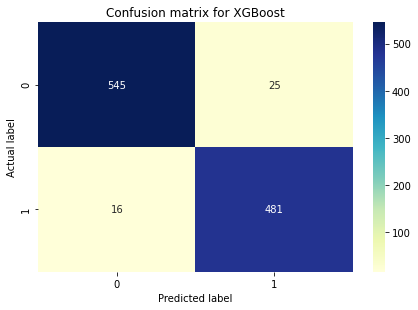

In [ ]:
# Making the Confusion Matrix
cm = confusion_matrix(yvalid, xg_pred)
#print(cm)
# create heatmap
sns.heatmap(pd.DataFrame(cm), annot=True, cmap="YlGnBu" ,fmt='g')

plt.tight_layout()
plt.title('Confusion matrix for XGBoost', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
print("Model Accuracy for XGBoost:",metrics.accuracy_score(yvalid, xg_pred) * 100)

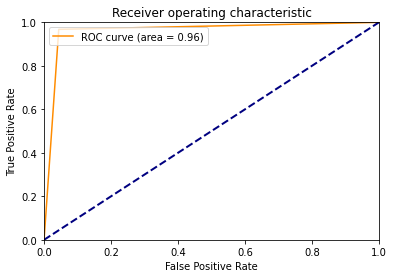

In [ ]:
get_roc(yvalid,xg_pred)

Average precision-recall score : 0.9349856114807094


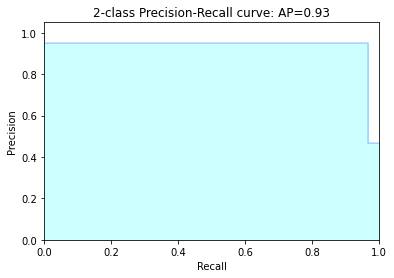

In [ ]:
get_prec_recall(yvalid,xg_pred)

In [ ]:
import tensorflow as tf
import keras.layers as layers
from keras.models import Model
from keras.datasets import imdb
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.layers import Input,Embedding,Dense,Flatten
from sklearn.metrics import accuracy_score,classification_report
from sklearn.metrics import f1_score

Using TensorFlow backend.


In [ ]:
from keras import models

In [ ]:
my_callbacks = [tf.keras.callbacks.EarlyStopping(patience=50)]

In [ ]:
model = models.Sequential()
model.add(Dense(512, activation='relu', input_shape=(200,)))
model.add(Dense(512, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.compile(loss="binary_crossentropy",optimizer="adam",metrics= ["accuracy"])
result = model.fit(xtrain_w2v,ytrain,epochs=100,batch_size=64,callbacks = my_callbacks, validation_data=(xvalid_w2v,yvalid))

Train on 2487 samples, validate on 1067 samples
Epoch 1/100
2487/2487 [==============================] - 0s 89us/step - loss: 0.2716 - accuracy: 0.8778 - val_loss: 0.1524 - val_accuracy: 0.9466
Epoch 2/100
2487/2487 [==============================] - 0s 54us/step - loss: 0.1172 - accuracy: 0.9558 - val_loss: 0.0950 - val_accuracy: 0.9616
Epoch 3/100
2487/2487 [==============================] - 0s 51us/step - loss: 0.0909 - accuracy: 0.9658 - val_loss: 0.0819 - val_accuracy: 0.9728
Epoch 4/100
2487/2487 [==============================] - 0s 58us/step - loss: 0.0572 - accuracy: 0.9815 - val_loss: 0.0821 - val_accuracy: 0.9681
Epoch 5/100
2487/2487 [==============================] - 0s 63us/step - loss: 0.0483 - accuracy: 0.9815 - val_loss: 0.0869 - val_accuracy: 0.9663
Epoch 6/100
2487/2487 [==============================] - 0s 54us/step - loss: 0.0361 - accuracy: 0.9899 - val_loss: 0.0904 - val_accuracy: 0.9663
Epoch 7/100
2487/2487 [==============================] - 0s 52us/step - loss

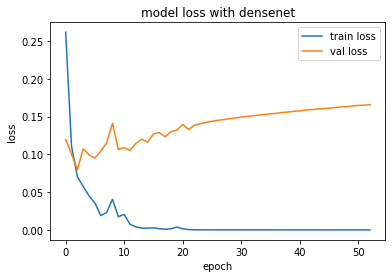

<Figure size 432x288 with 0 Axes>

In [ ]:
# loss
plt.plot(result.history['loss'], label='train loss')
plt.plot(result.history['val_loss'], label='val loss')
plt.legend()
plt.title('model loss with densenet')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()
plt.savefig('LossVal_loss')

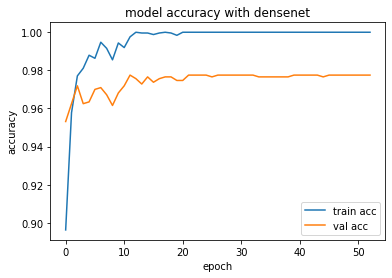

<Figure size 432x288 with 0 Axes>

In [ ]:
# accuracies
plt.plot(result.history['accuracy'], label='train acc')
plt.plot(result.history['val_accuracy'], label='val acc')
plt.title('model accuracy with densenet')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend()
plt.show()
plt.savefig('AccVal_acc')